In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

%cd /Midgard/home/amirme/an_explanation_model
from source.project_manager import (
    load_experiment_metadata,
    delete_experiment_data,
    check_file_exists,
)
from source.data_manager import plot_masks,fisher_information,preprocess_masks,symmetric_minmax_normalize,minmax_normalize,sum_channels
from source.labels import IMAGENET_LABELS

imshow_args = {"cmap": "viridis"}

/Midgard/home/amirme/an_explanation_model


2023-09-20 10:23:29.055133: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-20 10:23:30.215516: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/Midgard/home/amirme/miniconda3/envs/xmodel/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
project_metadata = load_experiment_metadata(glob_path="experiment_3/*")
print(project_metadata.columns)
project_metadata["projection_distribution"].fillna("None", inplace=True)
project_metadata = project_metadata.set_index(
    [
        "stream_name",
        "stream_statistic",
        "image_index",
        "projection_distribution",
        "alpha_mask_value",
        "projection_top_k",
    ]
).sort_index()
print(project_metadata.shape)

Index(['method', 'alpha_mask_type', 'alpha_mask_value', 'projection_type',
       'projection_top_k', 'baseline_mask_type', 'write_demo', 'architecture',
       'max_batches', 'min_change', 'seed', 'batch_size', 'num_classes',
       'input_shape', 'image_index', 'monitored_statistic', 'monitored_stream',
       'dataset', 'output_layer', 'label', 'image_path', 'time_to_compute',
       'batch_index', 'monitored_statistic_change', 'data_path', 'stream_name',
       'stream_statistic', 'csv_file_path', 'stats_log_level',
       'projection_distribution'],
      dtype='object')
(660, 24)


In [3]:
vc = project_metadata.index.value_counts()
print(vc)
print(len(vc))

stream_name            stream_statistic  image_index  projection_distribution  alpha_mask_value  projection_top_k
log_probs              meanx             3            None                     0.2               1                   1
results_at_projection  meanx             11           None                     0.6               10                  1
                                                      uniform                  0.3               10                  1
                                                                               0.4               10                  1
                                                                               0.5               10                  1
                                                                                                                    ..
                                         3            None                     0.2               1                   1
                                                     

In [5]:
for name in project_metadata.index.names:
    print(name,"=",project_metadata.index.get_level_values(name).value_counts().to_dict())

stream_name = {'log_probs': 220, 'results_at_projection': 220, 'vanilla_grad_mask': 220}
stream_statistic = {'meanx': 440, 'meanx2': 220}
image_index = {3: 165, 5: 165, 9: 165, 11: 165}
projection_distribution = {'None': 600, 'uniform': 60}
alpha_mask_value = {0.2: 132, 0.3: 132, 0.4: 132, 0.5: 132, 0.6: 132}
projection_top_k = {10: 120, 1: 60, 2: 60, 3: 60, 4: 60, 5: 60, 6: 60, 7: 60, 8: 60, 9: 60}


In [21]:
shape = (10, 1, 1, 1)
uniform_prior = np.ones(shape=shape) / shape[0]
image_index = slice(None)
projection_distribution = "None"
static_metadata = project_metadata.loc[
    ("vanilla_grad_mask", "meanx2", image_index, projection_distribution),
]
dynamic_metadata = project_metadata.loc[
    ("vanilla_grad_mask", "meanx2", image_index, "uniform"),
]
dynamic_metadata = dynamic_metadata.droplevel(
    ["stream_name", "stream_statistic", "projection_distribution", "projection_top_k"]
)
static_metadata = static_metadata.droplevel(
    ["stream_name", "stream_statistic", "projection_distribution"]
)

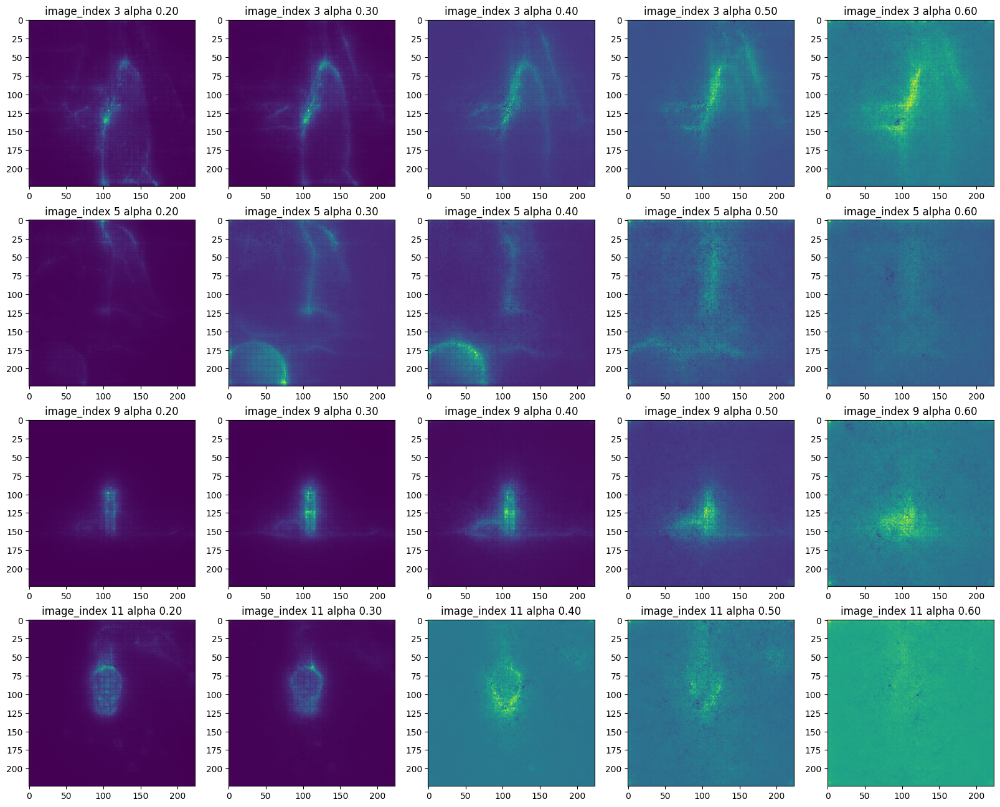

In [41]:
fisher_masks = dynamic_metadata.groupby(["image_index", "alpha_mask_value"]).apply(
    lambda group: fisher_information(
        group, static_metadata.loc[group.index[0]], uniform_prior
    )
)

titles = fisher_masks.index.to_series().apply(
    lambda x: f"{fisher_masks.index.names[0]} {x[0]} alpha {x[1]:.2f}"
)
fisher_masks = preprocess_masks(
    fisher_masks, preprocesses=[sum_channels, minmax_normalize]
)
plot_masks(fisher_masks, titles=titles, imshow_args=imshow_args, ncols=5)

# Visulize noise interpolation and fisher information

['alpha_mask_value', 'projection_top_k']


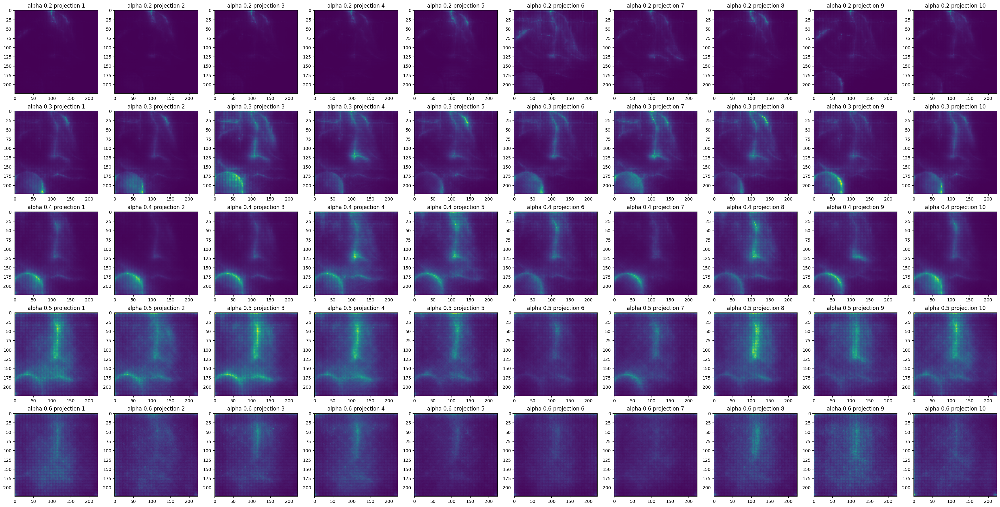

In [71]:
alpha = 0.3
image_index = 5
projection_distribution = "None"
meanx2 = project_metadata.loc[
    (
        "vanilla_grad_mask",
        "meanx2",
        image_index,
        projection_distribution,
    ),
    "data_path",
].apply(lambda x: np.load(x))
meanx2 = preprocess_masks(meanx2, preprocesses=[sum_channels])
meanx2_min = meanx2.groupby("alpha_mask_value").apply(
    lambda group: group.apply(lambda x: x.min()).min()
)
meanx2_max = meanx2.groupby("alpha_mask_value").apply(
    lambda group: group.apply(lambda x: x.max()).max()
)
meanx2 = meanx2.groupby("alpha_mask_value").apply(
    lambda group: group.apply(
        lambda row: (row - meanx2_min.loc[group.index[0][0]])
        / (meanx2_max.loc[group.index[0][0]]-meanx2_min.loc[group.index[0][0]])
    )
)
meanx2 = meanx2.droplevel(0)
print(meanx2.index.names)

titles = meanx2.index.to_series().apply(lambda x: f"alpha {x[0]} projection {x[1]}")
plot_masks(meanx2, titles=titles, imshow_args=imshow_args, ncols=10)

['alpha_mask_value', 'projection_top_k']


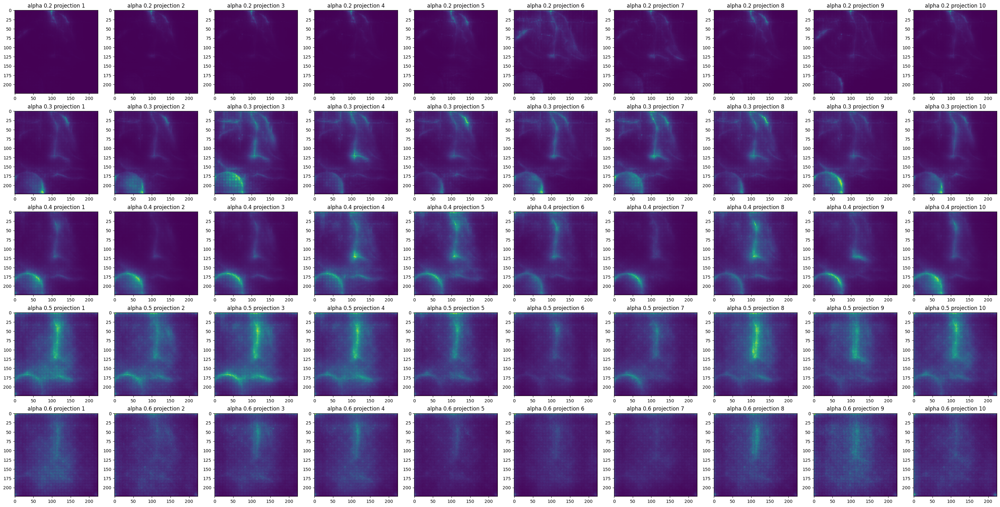

In [82]:
alpha = 0.3
image_index = 5
projection_distribution = "None"
meanx2 = project_metadata.loc[
    (
        "vanilla_grad_mask",
        "meanx2",
        image_index,
        projection_distribution,
    ),
    "data_path",
].apply(lambda x: np.load(x))
meanx2 = preprocess_masks(meanx2, preprocesses=[sum_channels])
meanx2_min = meanx2.groupby("projection_top_k").apply(
    lambda group: group.apply(lambda x: x.min()).min()
)
meanx2_max = meanx2.groupby("projection_top_k").apply(
    lambda group: group.apply(lambda x: x.max()).max()
)
meanx2 = meanx2.groupby("projection_top_k").apply(
    lambda group: group.apply(
        lambda row: (row - meanx2_min.loc[group.index[0][1]])
        / (meanx2_max.loc[group.index[0][1]]-meanx2_min.loc[group.index[0][1]])
    )
)
meanx2 = meanx2.droplevel(0)
print(meanx2.index.names)
meanx2.sort_index(inplace=True)
titles = meanx2.index.to_series().apply(lambda x: f"alpha {x[0]} projection {x[1]}")
plot_masks(meanx2, titles=titles, imshow_args=imshow_args, ncols=10)

['alpha_mask_value', 'projection_top_k']


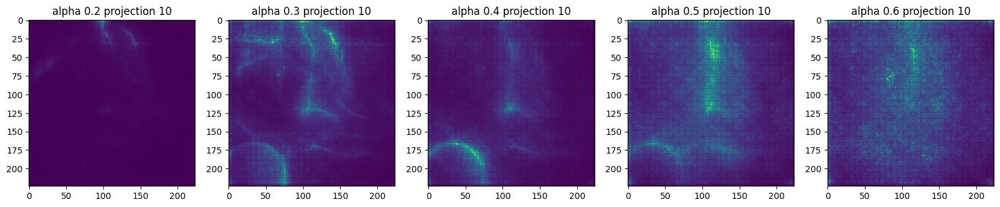

In [86]:
alpha = 0.3
image_index = 5
projection_distribution = "uniform"
meanx2 = project_metadata.loc[
    (
        "vanilla_grad_mask",
        "meanx2",
        image_index,
        projection_distribution,
    ),
    "data_path",
].apply(lambda x: np.load(x))
meanx2 = preprocess_masks(meanx2, preprocesses=[sum_channels, minmax_normalize])
print(meanx2.index.names)
titles = meanx2.index.to_series().apply(lambda x: f"alpha {x[0]} projection {x[1]}")
plot_masks(meanx2, titles=titles, imshow_args=imshow_args, ncols=5)